<a href="https://colab.research.google.com/github/Millennium133/digital_image_mini_project/blob/main/intro_dig_image_miniProject_real.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount("/content/drive",force_remount = True)

Mounted at /content/drive


In [17]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, f1_score, recall_score, classification_report, confusion_matrix
from sklearn.model_selection import StratifiedKFold
import seaborn as sns
import sys
np.set_printoptions(threshold=sys.maxsize)

1


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



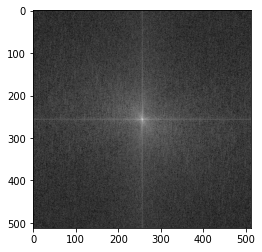

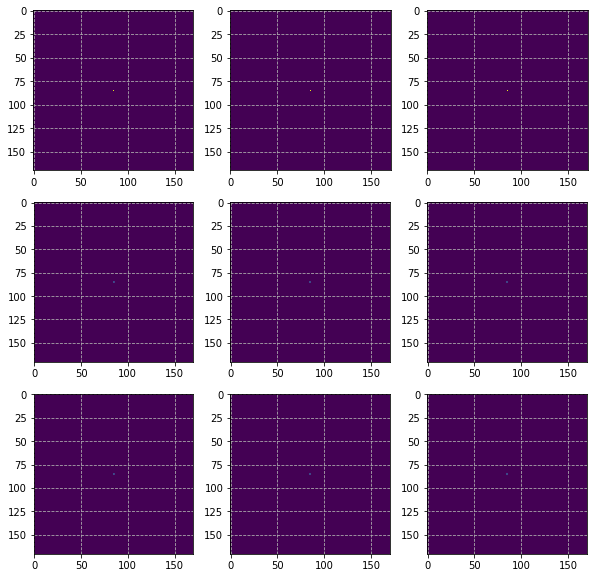

In [ ]:
path = "/content/drive/MyDrive/NaturalBlurSet/Original_132.jpg"
img = cv2.imread(path)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
reImg = cv2.resize(img,(512,512))
reImg = reImg/255
arrayImage = OriPlusdividedTo9Patch([reImg])
  #[[numpyarray1,numpyarray2,...,numpyarray10]] -- > 100 
arrayPS = useFT(arrayImage)
plt.imshow(np.log(arrayPS[0]),cmap="gray")
plt.show()
showImage9Parts(arrayPS[1:])

# **ฟังก์ชันที่เรียกใช้**

In [18]:
def showImage9Parts(image_list):
  #input - image_list of 9 images
  fig, axe = plt.subplots(3, 3, figsize = (10,10))
  for i, ax in enumerate(fig.axes):
    ax.grid('on', linestyle='--')
    # ax.set_xticklabels([])
    # ax.set_yticklabels([])
  for i in range (0,9):
    axe[i//3][i%3].imshow(image_list[i])
  plt.show()

In [19]:
def fourierTransform(img):
  return np.fft.fftshift(np.fft.fft2(img))
def powerSpectrum(FTimg):
  return 10*(np.abs(FTimg)**2 + 1)

In [20]:
def OriPlusdividedTo9Patch(imgList):
  print(len(imgList))
  arrayLists = []
  for index in range(len(imgList)):
    arrayList = []
    arrayList.append(imgList[index])
    print(imgList[index])
    width, height = imgList[index].shape
    xx = np.linspace(0, width, 4).astype(np.uint32)
    yy = np.linspace(0, height, 4).astype(np.uint32)
    for i in range(3):
      for j in range(3):
        arrayList.append(imgList[index][xx[i]:xx[i+1], yy[j]:yy[j+1]])
    arrayLists.append(arrayList)
  return arrayLists

In [21]:
def useFT(arrayImg):
  arrayPS = []
  for i in range(len(arrayImg)):
    for j in range(len(arrayImg[i])):
      FTImage = fourierTransform(arrayImg[i][j])
      PSImage = powerSpectrum(FTImage)
      #print(PSImage)
      arrayPS.append(PSImage)
  return arrayPS

In [22]:
def showHistogram(arrayPS):
  results = []
  for i in range(len(arrayPS)):
    result = np.histogram(arrayPS[i].flatten(),bins = [0,100,150,200,300,arrayPS[i].max()])
    results.append(result)
  print(results)


In [23]:
def estimate_5_bin_histogram(imageList):
  #imageList is list of list of numpy
  #input - power spectrum
  #output - [x1, x2, x3, x4, x5]
  FirstResult = 0
  for i in range(len(imageList)):
    for j in range(len(imageList[i])):
      if i == 0 and j == 0:
        FirstResult = np.histogram(imageList[i][j].flatten(), [0, 100, 150, 200, 300, np.Inf])[0].astype(int)
      else:
        otherResult = np.histogram(imageList[i][j].flatten(), [0, 100, 150, 200, 300, np.Inf])[0].astype(int)
        FirstResult = np.concatenate((np.array(FirstResult),np.array(otherResult)),axis=None)
  return FirstResult

# **ทำตรงด้านล่าง(convertImageToVector)เป้นหลัก**

In [24]:
def convertImageToVector(path):
  img = cv2.imread(path)
  grayImg = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  resizedGrayImg = cv2.resize(grayImg,(512,512))
  resizedGrayImg = resizedGrayImg/255
  #0-9 original and 9 patches of original image
  arrayImage = OriPlusdividedTo9Patch([resizedGrayImg])
  #[[numpyarray1,numpyarray2,...,numpyarray10]] -- > 100 
  arrayPS = useFT(arrayImage)
  arrayPS9PatchPlus1 = OriPlusdividedTo9Patch(arrayPS)
  array5Bin = estimate_5_bin_histogram(arrayPS9PatchPlus1)
  print(array5Bin)
  Normalise5Bin = array5Bin/(array5Bin.max())
  return Normalise5Bin

# **เตรียมข้อมูลแต่ละรูปใน training**

**กระบวนการเอาทุกรูปใน folder จาก train.csv แล้วมาทำเป้น X_train,Y_train โดยแต่ละรูปผ่านฟังก์ชัน converImageVector**

In [ ]:
train_data = pd.read_csv("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/TrainingSet/Train.csv")

In [ ]:
train_data

,img_name,label
0,CERTH_TrainingSet_Artificially-Blurred_000.jpg,1
1,CERTH_TrainingSet_Artificially-Blurred_001.jpg,1
2,CERTH_TrainingSet_Artificially-Blurred_002.jpg,1
3,CERTH_TrainingSet_Artificially-Blurred_003.jpg,1
4,CERTH_TrainingSet_Artificially-Blurred_004.jpg,1
...,...,...
995,CERTH_TrainingSet_Undistorted_625.jpg,-1
996,CERTH_TrainingSet_Undistorted_626.jpg,-1
997,CERTH_TrainingSet_Undistorted_627.jpg,-1
998,CERTH_TrainingSet_Undistorted_628.jpg,-1


In [ ]:
train_data["img_name"]

0      CERTH_TrainingSet_Artificially-Blurred_000.jpg
1      CERTH_TrainingSet_Artificially-Blurred_001.jpg
2      CERTH_TrainingSet_Artificially-Blurred_002.jpg
3      CERTH_TrainingSet_Artificially-Blurred_003.jpg
4      CERTH_TrainingSet_Artificially-Blurred_004.jpg
                            ...                      
995             CERTH_TrainingSet_Undistorted_625.jpg
996             CERTH_TrainingSet_Undistorted_626.jpg
997             CERTH_TrainingSet_Undistorted_627.jpg
998             CERTH_TrainingSet_Undistorted_628.jpg
999             CERTH_TrainingSet_Undistorted_629.jpg
Name: img_name, Length: 1000, dtype: object

In [ ]:
def load_image(fileName):
  prefix = "TrainingSet"
  path = "/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/TrainingSet"
  if fileName.find("Artificially-Blurred") != -1 :
    path += "/Artificially-Blurred/" + fileName
  elif fileName.find("Naturally-Blurred") != -1 :
    path += "/Naturally-Blurred/" + fileName
  elif fileName.find("Undistorted") != -1 :
    path += "/Undistorted/" + fileName
  return path

เอา path ของทุกรูปมาไว้ใน listOfImage

In [ ]:
listOfImage = list(map(lambda fileName : load_image(fileName),train_data["img_name"]))

In [ ]:
pickle.dump(listOfImage, open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/TrainingSet/listOfImage_AONGeiei.pkl", 'wb'))

In [ ]:
listOfImage = pickle.load(open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/TrainingSet/listOfImage_AONGeiei.pkl", 'rb'))

เอา path แต่ละอันไปแปลงเป็นรูปและแปลงให้เป็น vector ขนาด 500 จำนวน 1000 รูป

In [ ]:
x_train = list(map(lambda eachImage: convertImageToVector(eachImage),listOfImage))

Streaming output truncated to the last 5000 lines.
[ 31602  14914  13176  21678 180774   5330   2548   2191   3556  15275
   2218   1163   1042   1823  22824   6593   2858   2478   3850  13291
   1584    829    815   1497  24345    205    135    137    245  28519
   1571    819    812   1480  24559   6579   2846   2478   3839  13328
   2191   1177   1030   1811  23032   5331   2539   2193   3577  15601
  16611   2666   1516   1696   6411   2559    267    132    113     65
   1738    423    241    236    554   2678    202     90     92    130
   1224    377    217    271   1103    274    115    127    227   2506
   1153    374    229    294   1199   2637    208     89     92    166
   1705    410    253    254    627   2643    290    138    117     61
  26391    728    360    340   1251   3192      0      0      0      0
   2981     98     49     43     21   3192      0      0      0      0
   3097     89     35     22      6   1321    344    186    206   1192
   3096     90     35     

In [ ]:
#for dumping files
pickle.dump(x_train, open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/TrainingSet/X_train_AONGeiei.pkl", 'wb'))

In [ ]:
#This is for picking already dumped files

y_train = pickle.load(open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/TrainingSet/Y_train_AONGeiei.pkl", 'rb'))

In [ ]:
print("x_train",x_train)
print("y_train",y_train)

x_train 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
y_train = list(map(lambda fileName : fileName,train_data["label"]))

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [ ]:
pickle.dump(y_train, open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/TrainingSet/Y_train_AONGeiei.pkl", 'wb'))

In [ ]:
y_train = pickle.load(open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/TrainingSet/Y_train_AONGeiei.pkl", 'rb'))
x_train = pickle.load(open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/TrainingSet/X_train_AONGeiei.pkl", 'rb'))

FileNotFoundError: ignored

In [ ]:

print("x_train",x_train)
print("y_train",y_train)

x_train [[2.59575670e-04 1.29787835e-04 9.92495209e-05 ... 3.05383141e-05
  4.58074712e-05 1.22764023e-02]
 [9.33592495e-04 6.19844197e-04 5.28015427e-04 ... 6.88715775e-05
  6.88715775e-05 1.21290500e-02]
 [3.13015330e-04 1.22152324e-04 1.06883283e-04 ... 1.52690405e-05
  3.43553411e-05 1.23106639e-02]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 1.23939514e-02]
 [7.62945274e-06 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 1.23902312e-02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 1.23939514e-02]]
y_train [ 1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1 

**ตรงนี้ทำงานไงนะ**

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
X = x_train
y = y_train

pipe_steps = [('SVC', SVC())]

parameters = {
    'SVC__C' : [0.01, 0.03, 0.1, 0.3, 1, 3, 10, 30],
    'SVC__gamma' : [0.01, 0.03, 0.1, 0.3, 1, 3, 10, 30]
}

pipeline = Pipeline(pipe_steps)
grid_search = GridSearchCV(pipeline, parameters, cv=10)
grid_search.fit(X, y)
print("Best score: %0.3f" % grid_search.best_score_)
print("Best parameters set:")
best_parameters = grid_search.best_estimator_.get_params()
for param in parameters.keys():
  print("\t%s: %r" % (param, best_parameters[param]))

Best score: 0.859
Best parameters set:
	SVC__C: 3
	SVC__gamma: 30


In [ ]:
clf = SVC(C = 1, gamma = 30)
clf.fit(x_train, y_train)

SVC(C=1, gamma=30)

In [ ]:
path = "/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet/NaturalBlurSet/CERTH_EvaluationSet_NaturalBlurSet_Original_0004.jpg"
image = convertImageToVector(path)
print(clf.predict([image]))

[-1]


In [ ]:
def k_fold(Model, X, y, cv=10):
  accuracy_per_fold = []
  f1_score_per_fold = []
  recall_per_fold = []
  precision_per_fold = []

  fold_no = 1
  kf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=1)
  for train, test in kf.split(X, y):
    model = SVC(C = 3, gamma=30)

    X_train, y_train = X[train], y[train]
    X_test, y_test = X[test], y[test]



    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test,y_pred)
    precision = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
  
    print('Fold No:', fold_no)
    print('Accuracy:', round(accuracy, 2))
    print('F1 Score:', round(f1, 2))
    print("Precision:", round(precision,2))
    print("Recall:", round(recall,2))
    accuracy_per_fold.append(accuracy)
    f1_score_per_fold.append(f1)
    recall_per_fold.append(recall)
    precision_per_fold.append(precision)
    fold_no += 1
  return accuracy_per_fold, f1_score_per_fold, recall_per_fold, precision_per_fold

In [ ]:
y_train = np.array(y_train)
x_train = np.array(x_train)
result = k_fold(clf, x_train, y_train)
print(result)

Fold No: 1
Accuracy: 0.86
F1 Score: 0.81
Precision: 0.81
Recall: 0.81
Fold No: 2
Accuracy: 0.89
F1 Score: 0.84
Precision: 0.91
Recall: 0.78
Fold No: 3
Accuracy: 0.88
F1 Score: 0.84
Precision: 0.84
Recall: 0.84
Fold No: 4
Accuracy: 0.88
F1 Score: 0.82
Precision: 0.9
Recall: 0.76
Fold No: 5
Accuracy: 0.85
F1 Score: 0.77
Precision: 0.89
Recall: 0.68
Fold No: 6
Accuracy: 0.87
F1 Score: 0.81
Precision: 0.88
Recall: 0.76
Fold No: 7
Accuracy: 0.81
F1 Score: 0.72
Precision: 0.78
Recall: 0.68
Fold No: 8
Accuracy: 0.85
F1 Score: 0.78
Precision: 0.87
Recall: 0.7
Fold No: 9
Accuracy: 0.83
F1 Score: 0.76
Precision: 0.79
Recall: 0.73
Fold No: 10
Accuracy: 0.91
F1 Score: 0.87
Precision: 0.91
Recall: 0.84
([0.86, 0.89, 0.88, 0.88, 0.85, 0.87, 0.81, 0.85, 0.83, 0.91], [0.8108108108108109, 0.8405797101449275, 0.8378378378378378, 0.823529411764706, 0.7692307692307693, 0.8115942028985507, 0.7246376811594203, 0.7761194029850748, 0.7605633802816901, 0.8732394366197184], [0.8108108108108109, 0.78378378378378

# **เตรียมรูป(DigitalBlur)ใน evaluationSet**

In [ ]:
DigitalBlur_data = pd.read_csv("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet/DigitalBlurSet.csv")

In [ ]:
DigitalBlur_data

,img_name,label
0,CERTH_EvaluationSet_DigitalBlurSet_DiskR10_01.jpg,1
1,CERTH_EvaluationSet_DigitalBlurSet_DiskR10_02.jpg,1
2,CERTH_EvaluationSet_DigitalBlurSet_DiskR10_03.jpg,1
3,CERTH_EvaluationSet_DigitalBlurSet_DiskR10_04.jpg,1
4,CERTH_EvaluationSet_DigitalBlurSet_DiskR10_05.jpg,1
...,...,...
475,CERTH_EvaluationSet_DigitalBlurSet_Original_26...,-1
476,CERTH_EvaluationSet_DigitalBlurSet_Original_27...,-1
477,CERTH_EvaluationSet_DigitalBlurSet_Original_28...,-1
478,CERTH_EvaluationSet_DigitalBlurSet_Original_29...,-1


In [ ]:
DigitalBlur_data["img_name"]

0      CERTH_EvaluationSet_DigitalBlurSet_DiskR10_01.jpg
1      CERTH_EvaluationSet_DigitalBlurSet_DiskR10_02.jpg
2      CERTH_EvaluationSet_DigitalBlurSet_DiskR10_03.jpg
3      CERTH_EvaluationSet_DigitalBlurSet_DiskR10_04.jpg
4      CERTH_EvaluationSet_DigitalBlurSet_DiskR10_05.jpg
                             ...                        
475    CERTH_EvaluationSet_DigitalBlurSet_Original_26...
476    CERTH_EvaluationSet_DigitalBlurSet_Original_27...
477    CERTH_EvaluationSet_DigitalBlurSet_Original_28...
478    CERTH_EvaluationSet_DigitalBlurSet_Original_29...
479    CERTH_EvaluationSet_DigitalBlurSet_Original_30...
Name: img_name, Length: 480, dtype: object

In [ ]:
def loadEvaluationImage(path):
  base = "/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet"
  if path.find("DigitalBlurSet") != -1:
    base += "/DigitalBlurSet/" + path
  elif path.find("NaturalBlurSet") != -1:
    base += "/NaturalBlurSet/" + path
  return base

In [ ]:
listOfEvaluationDigitalBlurImage = list(map(lambda fileName : loadEvaluationImage(fileName),DigitalBlur_data["img_name"]))

In [ ]:
pickle.dump(listOfEvaluationDigitalBlurImage, open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet/DigitalBlurPath_AONGeiei.pkl", 'wb'))


In [ ]:
# listOfEvaluationImage
x_test = list(map(lambda filepath: convertImageToVector(filepath), listOfEvaluationDigitalBlurImage))

Streaming output truncated to the last 5000 lines.
   2462    145     82    131    429   1008    144    104    162   1831
   2462    145     82    131    429   3085     58     40     26     40
   2479    146    126    172    326   2897     74     44     54    180
  24580    842    538    612   2669   3021     59     31     59     79
   2874     74     59     71    171   3173     38     24      8      6
   2647    133     76     71    322   1150    234    158    194   1513
   2647    133     76     71    322   3173     38     24      8      6
   2874     74     59     71    171   3021     59     31     59     79]
[176181  13986   7806   9402  54769  22512   1336    670    751   3631
  17361   2060   1099   1329   7221  23829   1104    617    719   2801
  21084   1762   1015   1129   4080   6167   1448   1000   1519  19107
  21178   1765   1007   1132   4159  23839   1095    617    726   2793
  17543   2062   1086   1313   7237  22668   1354    695    784   3740
  28686      8     53    

In [ ]:
x_digitalBlur_test = x_test

In [ ]:
y_digitalBlur_test = list(map(lambda y:y, DigitalBlur_data["label"]))
y_digitalBlur_test

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [ ]:
pickle.dump(x_digitalBlur_test, open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet/X_digitalBlur_test_AONGeiei.pkl", 'wb'))
pickle.dump(y_digitalBlur_test, open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet/Y_digitalBlur_test_AONGeiei.pkl", 'wb'))


In [ ]:
def evaluationSet(model,X,Y):
  y_pred = model.predict(X)

  accuracy = accuracy_score(Y, y_pred)
  recall = recall_score(Y,y_pred)
  precision = precision_score(Y, y_pred)
  f1 = f1_score(Y, y_pred)
  print(classification_report(Y,y_pred))
  print('Accuracy:', accuracy)
  print("Precision:", precision)
  print("Recall:", recall)
  print('F1 Score:', f1)
  plt.figure(figsize=(8,4))
  
  print(confusion_matrix(Y,y_pred))
  sns.heatmap(confusion_matrix(Y,y_pred),annot = True, annot_kws={"size":20}, xticklabels=["Normal (-1)", "Blur (1)"], yticklabels=["Normal (-1)", "Blur (1)"], fmt='g')
  plt.title("Digital Blur TestSet", size = 20)
  plt.xlabel("predicted label", size = 15)
  plt.ylabel("true label", size = 15)


              precision    recall  f1-score   support

          -1       1.00      0.97      0.98        30
           1       1.00      1.00      1.00       450

    accuracy                           1.00       480
   macro avg       1.00      0.98      0.99       480
weighted avg       1.00      1.00      1.00       480

Accuracy: 0.9979166666666667
Precision: 0.9977827050997783
Recall: 1.0
F1 Score: 0.9988901220865705
[[ 29   1]
 [  0 450]]


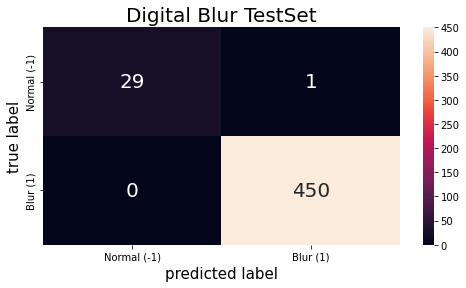

In [ ]:
evaluationSet(clf,x_digitalBlur_test, y_digitalBlur_test)

# **เตรียมรูป(NaturalBlur)ใน evaluationSet**

In [ ]:
NaturalBlur_data = pd.read_csv("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet/NaturalBlurSet.csv")

In [ ]:
NaturalBlur_data

,img_name,label
0,CERTH_EvaluationSet_NaturalBlurSet_Original_00...,-1
1,CERTH_EvaluationSet_NaturalBlurSet_Original_00...,-1
2,CERTH_EvaluationSet_NaturalBlurSet_Original_00...,-1
3,CERTH_EvaluationSet_NaturalBlurSet_Original_00...,1
4,CERTH_EvaluationSet_NaturalBlurSet_Original_00...,1
...,...,...
995,CERTH_EvaluationSet_NaturalBlurSet_Original_09...,-1
996,CERTH_EvaluationSet_NaturalBlurSet_Original_09...,-1
997,CERTH_EvaluationSet_NaturalBlurSet_Original_09...,-1
998,CERTH_EvaluationSet_NaturalBlurSet_Original_09...,-1


In [ ]:
NaturalBlur_data["img_name"]

0      CERTH_EvaluationSet_NaturalBlurSet_Original_00...
1      CERTH_EvaluationSet_NaturalBlurSet_Original_00...
2      CERTH_EvaluationSet_NaturalBlurSet_Original_00...
3      CERTH_EvaluationSet_NaturalBlurSet_Original_00...
4      CERTH_EvaluationSet_NaturalBlurSet_Original_00...
                             ...                        
995    CERTH_EvaluationSet_NaturalBlurSet_Original_09...
996    CERTH_EvaluationSet_NaturalBlurSet_Original_09...
997    CERTH_EvaluationSet_NaturalBlurSet_Original_09...
998    CERTH_EvaluationSet_NaturalBlurSet_Original_09...
999    CERTH_EvaluationSet_NaturalBlurSet_Original_10...
Name: img_name, Length: 1000, dtype: object

In [ ]:
listOfEvaluationNaturalBlurImage = list(map(lambda fileName : loadEvaluationImage(fileName),NaturalBlur_data["img_name"]))

In [ ]:
pickle.dump(listOfEvaluationNaturalBlurImage, open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet/NaturalBlurPath_AONGeiei.pkl", 'wb'))

In [ ]:
# listOfEvaluationImage
x_NaturalBlur_test = list(map(lambda filepath: convertImageToVector(filepath), listOfEvaluationNaturalBlurImage))

Streaming output truncated to the last 5000 lines.
  13707   2938   1646   1918   8861   2370    388    164    170    100
   1560    434    266    272    660   2411    389    170    142     80
    448    203    184    274   2140    153     99     62    149   2786
    457    201    183    281   2127   2408    396    178    163    104
   1542    431    266    283    727   2358    397    173    184    137
  10732   3288   2234   2854   9962   1789    493    301    345    264
   1256    405    288    364    879   1697    437    292    302    464
    496    233    179    314   2027    311    146    107    188   2497
    483    227    174    308   2057   1677    432    292    308    540
   1241    421    295    368    924   1782    494    306    357    310
  11754   3316   2168   2638   9194   1903    511    282    299    197
   1354    415    302    375    803   2066    485    278    268    152
    464    207    179    299   2043    180     73     82    157   2757
    464    214    183    2

In [ ]:
y_NaturalBlur_test = list(map(lambda y:y, NaturalBlur_data["label"]))
y_NaturalBlur_test

[-1,
 -1,
 -1,
 1,
 1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 1,
 -1,
 1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 1,
 -1,
 -1,
 -1,
 1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 1,
 -1,
 1,
 1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 1,
 1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 -1,
 1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 1,
 1,
 1,

In [ ]:
pickle.dump(x_NaturalBlur_test, open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet/X_naturalBlur_test_AONGeiei.pkl", 'wb'))
pickle.dump(y_NaturalBlur_test, open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet/Y_naturalBlur_test_AONGeiei.pkl", 'wb'))


In [ ]:
y_test = pickle.load(open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet/Y_naturalBlur_test_AONGeiei.pkl", 'rb'))
x_test = pickle.load(open("/content/drive/MyDrive/university/Year 3 Term 1/intro dig imaging/dataset/CERTH_ImageBlurDataset/EvaluationSet/X_naturalBlur_test_AONGeiei.pkl", 'rb'))

In [ ]:
def evaluationSet(model,X,Y):
  y_pred = model.predict(X)

  accuracy = accuracy_score(Y, y_pred)
  recall = recall_score(Y,y_pred)
  precision = precision_score(Y, y_pred)
  f1 = f1_score(Y, y_pred)
  print('Accuracy:', accuracy)
  print(classification_report(Y,y_pred))
  print("Precision:", precision)
  print("Recall:", recall)
  print('F1 Score:', f1)
  plt.figure(figsize=(8,4))

  print(confusion_matrix(Y,y_pred))
  sns.heatmap(confusion_matrix(Y,y_pred),annot = True, annot_kws={"size":20}, xticklabels=["Normal (-1)", "Blur (1)"], yticklabels=["Normal (-1)", "Blur (1)"], fmt='g')
  plt.title("Natural Blur TestSet", size = 20)
  plt.xlabel("predicted label", size = 15)
  plt.ylabel("true label", size = 15)


              precision    recall  f1-score   support

          -1       0.83      0.94      0.88       589
           1       0.90      0.73      0.80       411

    accuracy                           0.85      1000
   macro avg       0.87      0.84      0.84      1000
weighted avg       0.86      0.85      0.85      1000

Precision: 0.9006024096385542
Recall: 0.7274939172749392
Accuracy: 0.855
F1 Score: 0.8048452220726784
[[556  33]
 [112 299]]


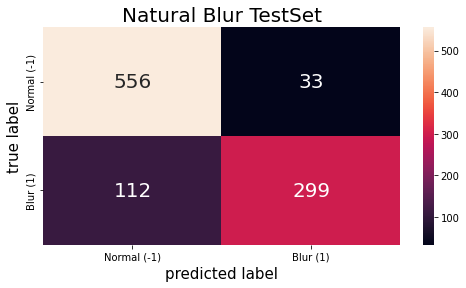

In [ ]:
evaluationSet(clf,x_NaturalBlur_test, y_NaturalBlur_test)

In [ ]:
# x_test

[array([4.89800743e-02, 2.61734946e-02, 2.51927548e-02, 4.73995070e-02,
        1.00000000e+00, 8.46325947e-03, 4.53154348e-03, 4.46586894e-03,
        7.71894798e-03, 1.01353333e-01, 2.23731277e-03, 1.11208893e-03,
        1.09895402e-03, 2.21104296e-03, 1.20617866e-01, 8.48515099e-03,
        4.48776045e-03, 4.24695380e-03, 8.03856409e-03, 1.02018835e-01,
        4.82926808e-03, 2.71454779e-03, 2.57006379e-03, 5.16639740e-03,
        1.11996988e-01, 8.53769062e-04, 4.42208591e-04, 4.07182168e-04,
        1.10771063e-03, 1.25215084e-01, 4.80299826e-03, 2.73206100e-03,
        2.53941567e-03, 5.19266722e-03, 1.12758812e-01, 8.62525668e-03,
        4.52278688e-03, 4.30387173e-03, 8.05607730e-03, 1.01769272e-01,
        2.23293447e-03, 1.12084554e-03, 1.11208893e-03, 2.23731277e-03,
        1.21322773e-01, 8.45012456e-03, 4.50965197e-03, 4.44835573e-03,
        7.67078665e-03, 1.02947036e-01, 1.23717705e-01, 3.67777442e-04,
        1.83888721e-04, 2.53941567e-04, 2.00964102e-03, 1.373035